In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from torch.utils.data import Dataset, DataLoader
from torchvision import datasets, transforms
from torchvision.transforms import ToTensor
import torch.optim as optim
import torch.nn as nn
import torch.nn.functional as F
import pandas as pd
import os
import zipfile
from torchvision import transforms
from torch.utils.data import Dataset
from PIL import Image
import os
import torch

In [ ]:
!ls
zip_path = "/content/SplitImages-20260108T110541Z-3-001.zip"
extract_dir = "images"
os.makedirs(extract_dir, exist_ok=True)

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_dir)

annot_crops.csv  images  sample_data  SplitImages-20260108T110541Z-3-001.zip


In [ ]:
os.listdir("images/SplitImages")

['2020-115 (1)_4.jpg',
 '2019-34_2.jpg',
 '2019-21_5.jpg',
 '2020-115 (2)_4.jpg',
 '2019-27_5.jpg',
 '2019-04_2.jpg',
 '2020-122_4.jpg',
 '2020-96_3.jpg',
 '2019-30_3.jpg',
 '2019-03 (2)_3.jpg',
 '2020-115 (2)_1.jpg',
 '2019-34_4.jpg',
 '2019-32_3.jpg',
 '2020-97_4.jpg',
 '2019-06_5.jpg',
 '2019-15_1.jpg',
 '2020-106 (2)_4.jpg',
 '2020-88_3.jpg',
 '2019-31_3.jpg',
 '2019-36_2.jpg',
 '2019-06_2.jpg',
 'B2023-03383_4.jpg',
 '2019-31_1.jpg',
 '2019-29_5.jpg',
 '2019-15_4.jpg',
 '2020-122_5.jpg',
 '2020-119_5.jpg',
 '2019-12_2.jpg',
 '2020-116_3.jpg',
 '2020-96_4.jpg',
 '2020-131_2.jpg',
 'B2022-03609 (1)_4.jpg',
 '2020-105 (1)_2.jpg',
 '2019-39_5.jpg',
 '2019-03 (1)_3.jpg',
 '2020-04_4.jpg',
 '2020-117_3.jpg',
 '2020-107_2.jpg',
 '2019-03 (2)_5.jpg',
 '2020-106 (2)_2.jpg',
 '2019-34_5.jpg',
 '2019-32_4.jpg',
 '2019-41_1.jpg',
 'B2024-01864 (1)_4.jpg',
 'B2024-01864 (1)_2.jpg',
 '2020-115 (1)_1.jpg',
 '2020-121_1.jpg',
 'B2024-05143 (1)_3.jpg',
 '2019-24_4.jpg',
 '2020-89_1.jpg',
 'c200651

In [ ]:
i = 0
sizes = {}
for im_path in os.listdir("images/SplitImages"):
  I = Image.open(f'images/SplitImages/{im_path}')
  I = np.array(I)
  sizes[im_path] = (I.shape[0], I.shape[1])

In [ ]:
widest_img = max(sizes.items(), key=lambda x: x[1][1])
tallest_img = max(sizes.items(), key=lambda x:x[1][0])
filename, (h, w) = widest_img

print(f'Widest : {filename}: {h, w}')

filename, (h, w) = tallest_img
print(f'Tallest : {filename}: {h, w}')

Widest : B2024-06223 (1)_5.JPG: (200, 1441)
Tallest : 2020-115 (1)_4.jpg: (200, 559)


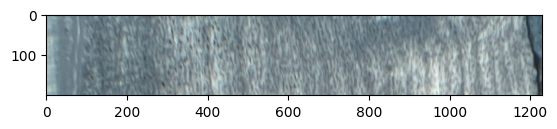

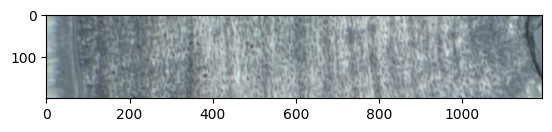

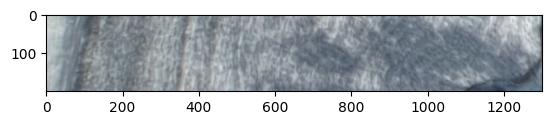

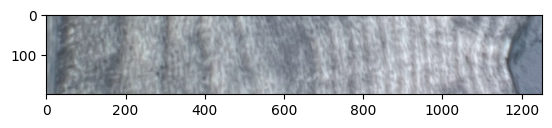

In [ ]:
for i in range(1,5):
  plt.figure()
  I = Image.open(f'images/SplitImages/B2024-06223 (1)_{i}.JPG')
  I = np.array(I)[0:200, 0:1400]
  plt.imshow(I)

In [ ]:
widths = [size[1] for size in sizes.values()]
mean_width = np.mean(widths)
print(f"Mean width: {mean_width:.2f} pixels")

labels_df = pd.read_csv("annot_crops.csv")
age_mean = labels_df['age'].mean()
age_std = labels_df['age'].std()
print(f'Mean age: {age_mean:.2f} ')
print(f'Std age: {age_std:.2f}')

Mean width: 527.53 pixels
Mean age: 5.15 
Std age: 6.61


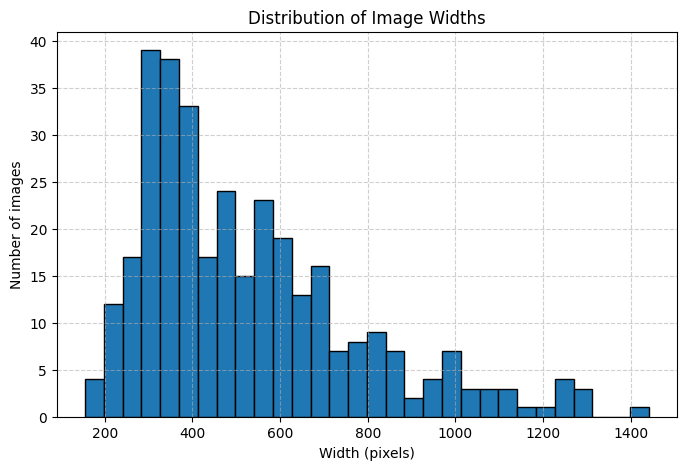

In [ ]:
widths = [size[1] for size in sizes.values()]

plt.figure(figsize=(8, 5))
plt.hist(widths, bins=30, edgecolor='black')
plt.title("Distribution of Image Widths")
plt.xlabel("Width (pixels)")
plt.ylabel("Number of images")
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

Mean: tensor([0.4533, 0.4691, 0.4300]) Std: tensor([0.1011, 0.0967, 0.1070])

In [ ]:
transform = transforms.Compose([
    transforms.Resize((200, 400)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.4533, 0.4691, 0.4300],
        std=[0.1011, 0.0967, 0.1070]
    )
])

class SealToothDataset(Dataset):
    def __init__(self, root_dir, labels_dict, age_mean=None, age_std=None, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.image_files = [f for f in os.listdir(root_dir)
                            if f in labels_dict and f.lower().endswith(('.jpg'))]
        self.labels_dict = labels_dict
        self.age_mean = age_mean
        self.age_std = age_std

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_name = self.image_files[idx]
        img_path = os.path.join(self.root_dir, img_name)
        image = Image.open(img_path).convert('RGB')
        if self.transform:
            image = self.transform(image)

        age = float(self.labels_dict[img_name])
        if self.age_mean is not None and self.age_std is not None:
            age = (age - self.age_mean) / self.age_std # normalization

        age = torch.tensor(age, dtype=torch.float32)
        return image, age


labels_df = pd.read_csv("annot_crops.csv")
labels_dict = dict(zip(labels_df['image'], labels_df['age']))

torch.Size([8, 3, 200, 400])
tensor([-0.6278, -0.6278,  1.9440, -0.4766, -0.6278,  0.5825, -0.6278, -0.0227])


<BarContainer object of 8 artists>

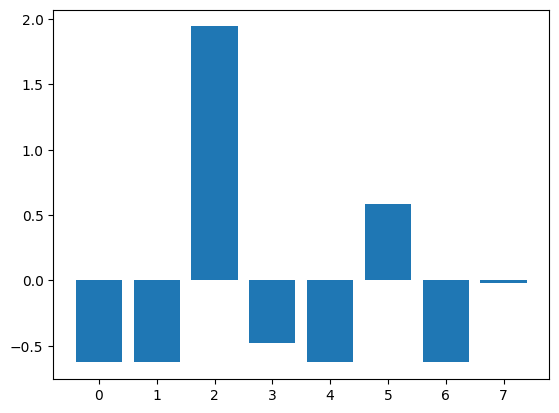

In [ ]:
dataset = SealToothDataset(root_dir="images/SplitImages/", labels_dict=labels_dict, age_mean=5.15, age_std=6.61, transform=transform)
loader = DataLoader(dataset, batch_size=8, shuffle=True)

images, ages = next(iter(loader))
print(images.shape)
print(ages)
plt.bar(range(len(ages)), ages)

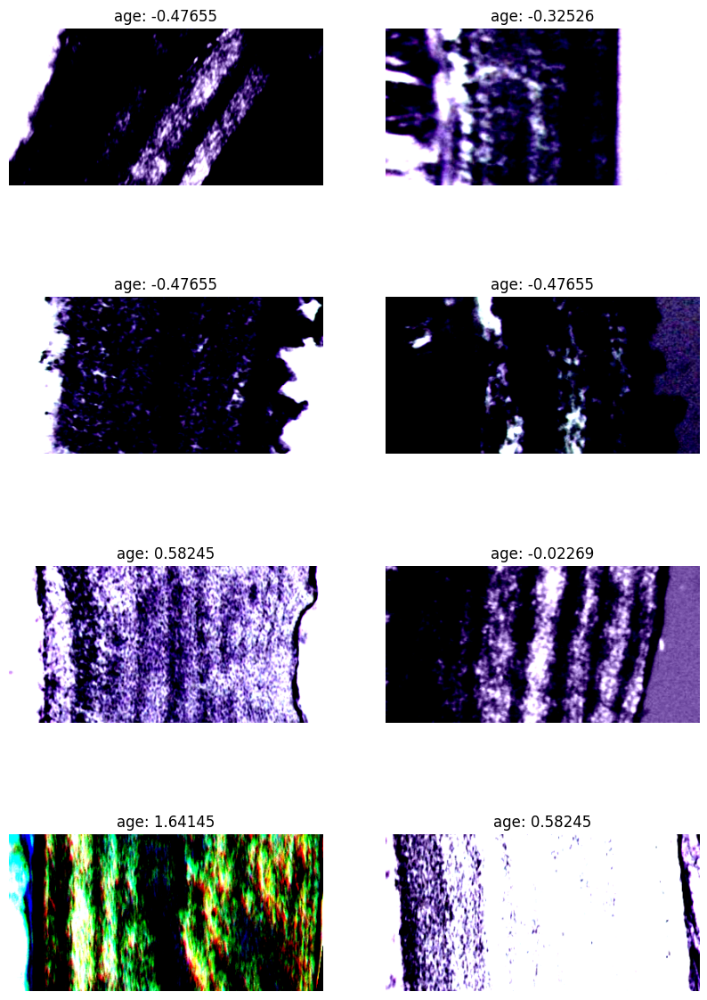

In [ ]:
images, ages = next(iter(loader))
f, a = plt.subplots(4,2, figsize=(10, 15))
a = a.ravel()

for i in range(8):
    img = images[i].permute(1, 2, 0)
    a[i].imshow(img)
    a[i].set_title(f"age: {ages[i].item():.5f}")
    a[i].axis('off')

In [ ]:
class DummyModel(nn.Module):
    def __init__(self, in_channels=3):
        super().__init__()
        self.features = nn.Sequential(
            nn.Conv2d(in_channels, 32, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),

            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),

            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),

            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.AdaptiveAvgPool2d((1, 1))
        )
        self.fc = nn.Linear(256, 1)

    def forward(self, x):
        x = self.features(x)
        x = torch.flatten(x, 1)
        x = self.fc(x)
        return x.squeeze(1)


In [ ]:
from torch.utils.data import random_split, DataLoader

dataset = SealToothDataset(root_dir="images/SplitImages/", labels_dict=labels_dict, age_mean=5.96, age_std=5.92, transform=transform)
train_ratio = 0.8
train_size = int(train_ratio * len(dataset))
test_size = len(dataset) - train_size

train_dataset, test_dataset = random_split(dataset, [train_size, test_size])

train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
test_loader  = DataLoader(test_dataset, batch_size=8, shuffle=False)


In [ ]:
from tqdm import tqdm
import matplotlib.pyplot as plt

# Hyperparameters
lr = 1e-3
num_epochs = 100
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = DummyModel().to(device)
optimizer = optim.Adam(model.parameters(), lr=lr)
criterion = nn.MSELoss()

# Lists to store losses
train_losses = []
val_losses = []

for epoch in range(num_epochs):
    # --- Training ---
    model.train()
    running_train_loss = 0.0
    train_loader_tqdm = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Train]", leave=False)
    for images, ages in train_loader_tqdm:
        images, ages = images.to(device), ages.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, ages)
        loss.backward()
        optimizer.step()

        running_train_loss += loss.item() * images.size(0)
        train_loader_tqdm.set_postfix(loss=loss.item())

    epoch_train_loss = running_train_loss / len(train_loader.dataset)
    train_losses.append(epoch_train_loss)

    # --- Validation ---
    model.eval()
    running_val_loss = 0.0
    val_loader_tqdm = tqdm(test_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Val]", leave=False)
    with torch.no_grad():
        for images, ages in val_loader_tqdm:
            images, ages = images.to(device), ages.to(device)
            outputs = model(images)
            loss = criterion(outputs, ages)
            running_val_loss += loss.item() * images.size(0)
            val_loader_tqdm.set_postfix(loss=loss.item())

    epoch_val_loss = running_val_loss / len(test_loader.dataset)
    val_losses.append(epoch_val_loss)

    print(f"Epoch {epoch+1}/{num_epochs}  Train Loss: {epoch_train_loss:.4f}  Val Loss: {epoch_val_loss:.4f}")


Epoch 1/100  Train Loss: 0.8469  Val Loss: 0.3858


Epoch 2/100  Train Loss: 0.7727  Val Loss: 0.4045


Epoch 3/100  Train Loss: 0.7534  Val Loss: 0.3796


Epoch 4/100  Train Loss: 0.7166  Val Loss: 0.3516


Epoch 5/100  Train Loss: 0.7765  Val Loss: 0.5101


Epoch 6/100  Train Loss: 0.7574  Val Loss: 0.3907


Epoch 7/100  Train Loss: 0.7022  Val Loss: 0.3136


Epoch 8/100  Train Loss: 0.6883  Val Loss: 0.3744


Epoch 9/100  Train Loss: 0.6674  Val Loss: 0.2981


Epoch 10/100  Train Loss: 0.6601  Val Loss: 0.3728


Epoch 11/100  Train Loss: 0.6672  Val Loss: 0.2744


Epoch 12/100  Train Loss: 0.6026  Val Loss: 0.3275


Epoch 13/100  Train Loss: 0.6736  Val Loss: 0.3018


Epoch 14/100  Train Loss: 0.6560  Val Loss: 0.2856


Epoch 15/100  Train Loss: 0.5289  Val Loss: 0.2869


Epoch 16/100  Train Loss: 0.5590  Val Loss: 0.2574


Epoch 17/100  Train Loss: 0.4782  Val Loss: 0.4769


Epoch 18/100  Train Loss: 0.5815  Val Loss: 0.2686


Epoch 19/100  Train Loss: 0.4450  Val Loss: 0.2220


Epoch 20/100  Train Loss: 0.4788  Val Loss: 0.2569


Epoch 21/100  Train Loss: 0.4347  Val Loss: 0.3116


Epoch 22/100  Train Loss: 0.3645  Val Loss: 0.6586


Epoch 23/100  Train Loss: 0.4600  Val Loss: 0.3059


Epoch 24/100  Train Loss: 0.4829  Val Loss: 0.3152


Epoch 25/100  Train Loss: 0.3354  Val Loss: 0.3018


Epoch 26/100  Train Loss: 0.3657  Val Loss: 0.2437


Epoch 27/100  Train Loss: 0.3348  Val Loss: 0.4664


Epoch 28/100  Train Loss: 0.3004  Val Loss: 0.4220


Epoch 29/100  Train Loss: 0.3925  Val Loss: 0.4048


Epoch 30/100  Train Loss: 0.3049  Val Loss: 0.2368


Epoch 31/100  Train Loss: 0.2994  Val Loss: 0.3319


Epoch 32/100  Train Loss: 0.2086  Val Loss: 0.1865


Epoch 33/100  Train Loss: 0.1913  Val Loss: 0.2400


Epoch 34/100  Train Loss: 0.3373  Val Loss: 0.3013


Epoch 35/100  Train Loss: 0.4213  Val Loss: 0.3568


Epoch 36/100  Train Loss: 0.2454  Val Loss: 0.4387


Epoch 37/100  Train Loss: 0.2016  Val Loss: 0.1785


Epoch 38/100  Train Loss: 0.1538  Val Loss: 0.1980


Epoch 39/100  Train Loss: 0.1738  Val Loss: 0.3368


Epoch 40/100  Train Loss: 0.1798  Val Loss: 0.2176


Epoch 41/100  Train Loss: 0.1455  Val Loss: 0.2769


Epoch 42/100  Train Loss: 0.1482  Val Loss: 0.1503


Epoch 43/100  Train Loss: 0.1220  Val Loss: 0.3336


Epoch 44/100  Train Loss: 0.1607  Val Loss: 0.1194


Epoch 45/100  Train Loss: 0.1670  Val Loss: 0.1271


Epoch 46/100  Train Loss: 0.0918  Val Loss: 0.1300


Epoch 47/100  Train Loss: 0.0970  Val Loss: 0.1347


Epoch 48/100  Train Loss: 0.0869  Val Loss: 0.1482


Epoch 49/100  Train Loss: 0.1224  Val Loss: 0.1483


Epoch 50/100  Train Loss: 0.1075  Val Loss: 0.2125


Epoch 51/100  Train Loss: 0.2084  Val Loss: 0.2239


Epoch 52/100  Train Loss: 0.1328  Val Loss: 0.1438


Epoch 53/100  Train Loss: 0.1218  Val Loss: 0.1382


Epoch 54/100  Train Loss: 0.1169  Val Loss: 0.1200


Epoch 55/100  Train Loss: 0.0995  Val Loss: 0.1384


Epoch 56/100  Train Loss: 0.1328  Val Loss: 0.1220


Epoch 57/100  Train Loss: 0.0966  Val Loss: 0.1750


Epoch 58/100  Train Loss: 0.0820  Val Loss: 0.1231


Epoch 59/100  Train Loss: 0.2284  Val Loss: 0.1593


Epoch 60/100  Train Loss: 0.1575  Val Loss: 0.1316


Epoch 61/100  Train Loss: 0.1137  Val Loss: 0.1523


Epoch 62/100  Train Loss: 0.1104  Val Loss: 0.1226


Epoch 63/100  Train Loss: 0.1072  Val Loss: 0.1137


Epoch 64/100  Train Loss: 0.0727  Val Loss: 0.0981


Epoch 65/100  Train Loss: 0.0637  Val Loss: 0.0977


Epoch 66/100  Train Loss: 0.0568  Val Loss: 0.1134


Epoch 67/100  Train Loss: 0.0826  Val Loss: 0.1287


Epoch 68/100  Train Loss: 0.0744  Val Loss: 0.1131


Epoch 69/100  Train Loss: 0.1134  Val Loss: 0.1436


Epoch 70/100  Train Loss: 0.0673  Val Loss: 0.1027


Epoch 71/100  Train Loss: 0.0958  Val Loss: 0.0865


Epoch 72/100  Train Loss: 0.0611  Val Loss: 0.0854


Epoch 73/100  Train Loss: 0.0660  Val Loss: 0.0856


Epoch 74/100  Train Loss: 0.0745  Val Loss: 0.1462


Epoch 75/100  Train Loss: 0.0760  Val Loss: 0.0957


Epoch 76/100  Train Loss: 0.0603  Val Loss: 0.0808


Epoch 77/100  Train Loss: 0.0478  Val Loss: 0.0927


Epoch 78/100  Train Loss: 0.0500  Val Loss: 0.1075


Epoch 79/100  Train Loss: 0.0486  Val Loss: 0.0769


Epoch 80/100  Train Loss: 0.0947  Val Loss: 0.1120


Epoch 81/100  Train Loss: 0.0800  Val Loss: 0.0926


Epoch 82/100  Train Loss: 0.0819  Val Loss: 0.0941


Epoch 83/100  Train Loss: 0.0688  Val Loss: 0.0997


Epoch 84/100  Train Loss: 0.0867  Val Loss: 0.0966


Epoch 85/100  Train Loss: 0.0598  Val Loss: 0.0754


Epoch 86/100  Train Loss: 0.0400  Val Loss: 0.0703


Epoch 87/100  Train Loss: 0.0590  Val Loss: 0.0871


Epoch 88/100  Train Loss: 0.0517  Val Loss: 0.0766


Epoch 89/100  Train Loss: 0.0396  Val Loss: 0.0786


Epoch 90/100  Train Loss: 0.0416  Val Loss: 0.0848


Epoch 91/100  Train Loss: 0.0321  Val Loss: 0.0820


Epoch 92/100  Train Loss: 0.0365  Val Loss: 0.0767


Epoch 93/100  Train Loss: 0.0617  Val Loss: 0.0953


Epoch 94/100  Train Loss: 0.0560  Val Loss: 0.0827


Epoch 95/100  Train Loss: 0.0680  Val Loss: 0.1143


Epoch 96/100  Train Loss: 0.0884  Val Loss: 0.0942


Epoch 97/100  Train Loss: 0.0580  Val Loss: 0.0735


Epoch 98/100  Train Loss: 0.0600  Val Loss: 0.0747


Epoch 99/100  Train Loss: 0.0440  Val Loss: 0.0658


Epoch 100/100  Train Loss: 0.0353  Val Loss: 0.0701


$$
MSE = \frac{1}{N}\sum_{i=0}^{N}(y_i-\hat{y}_i)^2
$$
In order to see how well our model actually performs, we plot the $RMSE$, taking the root of the $MSE$ while converting it back to un-normalized values $MSE\times \sigma^2$ (since our ages are normalized $y=\frac{y-\mu}{\sigma}$)
$$
RMSE = \sqrt{\frac{1}{N}\sum_{i=0}^{N}(y_i-\hat{y}_i)^2}
$$

In [ ]:
plt.figure(figsize=(8,5))

# converted to ME in years
train_losses_real = [np.sqrt(loss * age_std**2) for loss in train_losses]
val_losses_real = [np.sqrt(loss * age_std**2) for loss in val_losses]
print(f'Final train loss: {np.sqrt(train_losses[-1]* age_std**2)}')
print(f'Final val loss: {np.sqrt(val_losses[-1]* age_std**2)}')

plt.plot(train_losses_real, label="Train Loss")
plt.plot(val_losses_real, label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("RMSE")
plt.title("Train and Val Loss")
plt.legend()
plt.show()

Efficient Net

In [ ]:
!pip install efficientnet_pytorch

  Preparing metadata (setup.py) ... done
  Created wheel for efficientnet_pytorch: filename=efficientnet_pytorch-0.7.1-py3-none-any.whl size=16426 sha256=c496f1384b441903b17284402445c8461d37f9cb9bc10a983f9b03fcc35aa216
  Stored in directory: /root/.cache/pip/wheels/9c/3f/43/e6271c7026fe08c185da2be23c98c8e87477d3db63f41f32ad
Successfully built efficientnet_pytorch


In [ ]:
from efficientnet_pytorch import EfficientNet

class EfficientNetAgeRegressor(nn.Module):
    def __init__(self, model_name="efficientnet-b0"):
        super().__init__()
        self.backbone = EfficientNet.from_pretrained(model_name)
        in_features = self.backbone._fc.in_features
        self.backbone._fc = nn.Linear(in_features, 1)

    def forward(self, x):
        return self.backbone(x).squeeze(1)

Mean age: 5.15
Std age: 6.61

In [ ]:
from torch.utils.data import random_split, DataLoader

dataset = SealToothDataset(
    root_dir="images/SplitImages/",
    labels_dict=labels_dict,
    age_mean=5.15,
    age_std=6.61,
    transform=transform
)

train_ratio = 0.7
val_ratio   = 0.1
test_ratio  = 0.2

total_size = len(dataset)
train_size = int(train_ratio * total_size)
val_size   = int(val_ratio * total_size)
test_size  = total_size - train_size - val_size

train_dataset, val_dataset, test_dataset = random_split(dataset, [train_size, val_size, test_size])

train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True, num_workers=2)
val_loader   = DataLoader(val_dataset,   batch_size=8, shuffle=False, num_workers=2)
test_loader  = DataLoader(test_dataset,  batch_size=8, shuffle=False, num_workers=2)

print(f"Train: {len(train_dataset)}, Val: {len(val_dataset)}, Test: {len(test_dataset)}")


Train: 191, Val: 27, Test: 55


In [ ]:
import torch.optim as optim
from tqdm import tqdm

device = "cuda" if torch.cuda.is_available() else "cpu"
model = EfficientNetAgeRegressor("efficientnet-b0").to(device)

criterion = nn.SmoothL1Loss() # MAE
optimizer = optim.AdamW(model.parameters(), lr=1e-4)

epoch_losses_train = []
epoch_losses_val = []

for epoch in range(150):
    model.train()
    train_loss = 0

    for imgs, ages in tqdm(train_loader):
        imgs, ages = imgs.to(device), ages.to(device)

        preds = model(imgs)
        loss = criterion(preds, ages)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_loss += loss.item() * imgs.size(0)

    train_loss /= len(train_loader.dataset)
    epoch_losses_train.append(train_loss)
    print(f"Epoch {epoch} Train MAE: {train_loss:.3f}")

    # evaluation
    model.eval()
    val_loss = 0
    with torch.no_grad():
        for imgs, ages in val_loader:
            imgs, ages = imgs.to(device), ages.to(device)
            preds = model(imgs)
            loss = criterion(preds, ages)
            val_loss += loss.item() * imgs.size(0)

    val_loss /= len(val_loader.dataset)
    epoch_losses_val.append(val_loss)
    print(f"Epoch {epoch} Val MAE: {val_loss:.3f}")

Downloading: "https://github.com/lukemelas/EfficientNet-PyTorch/releases/download/1.0/efficientnet-b0-355c32eb.pth" to /root/.cache/torch/hub/checkpoints/efficientnet-b0-355c32eb.pth


100%|██████████| 20.4M/20.4M [00:00<00:00, 40.1MB/s]


Loaded pretrained weights for efficientnet-b0


100%|██████████| 24/24 [00:03<00:00,  7.75it/s]

Epoch 0 Train MAE: 0.180


Epoch 0 Val MAE: 0.219


100%|██████████| 24/24 [00:01<00:00, 19.86it/s]

Epoch 1 Train MAE: 0.106


Epoch 1 Val MAE: 0.156


100%|██████████| 24/24 [00:01<00:00, 19.58it/s]

Epoch 2 Train MAE: 0.075


Epoch 2 Val MAE: 0.107


100%|██████████| 24/24 [00:01<00:00, 19.57it/s]

Epoch 3 Train MAE: 0.047


Epoch 3 Val MAE: 0.072


100%|██████████| 24/24 [00:01<00:00, 19.67it/s]

Epoch 4 Train MAE: 0.077


Epoch 4 Val MAE: 0.054


100%|██████████| 24/24 [00:01<00:00, 19.34it/s]

Epoch 5 Train MAE: 0.052


Epoch 5 Val MAE: 0.083


100%|██████████| 24/24 [00:01<00:00, 19.54it/s]

Epoch 6 Train MAE: 0.053


Epoch 6 Val MAE: 0.036


100%|██████████| 24/24 [00:01<00:00, 19.56it/s]

Epoch 7 Train MAE: 0.058


Epoch 7 Val MAE: 0.053


100%|██████████| 24/24 [00:01<00:00, 19.15it/s]

Epoch 8 Train MAE: 0.065


Epoch 8 Val MAE: 0.038


100%|██████████| 24/24 [00:01<00:00, 19.65it/s]

Epoch 9 Train MAE: 0.058


Epoch 9 Val MAE: 0.039


100%|██████████| 24/24 [00:01<00:00, 19.79it/s]

Epoch 10 Train MAE: 0.048


Epoch 10 Val MAE: 0.032


100%|██████████| 24/24 [00:01<00:00, 19.53it/s]

Epoch 11 Train MAE: 0.034


Epoch 11 Val MAE: 0.035


100%|██████████| 24/24 [00:01<00:00, 19.54it/s]

Epoch 12 Train MAE: 0.048


Epoch 12 Val MAE: 0.046


100%|██████████| 24/24 [00:01<00:00, 18.92it/s]

Epoch 13 Train MAE: 0.028


Epoch 13 Val MAE: 0.057


100%|██████████| 24/24 [00:01<00:00, 19.72it/s]

Epoch 14 Train MAE: 0.036


Epoch 14 Val MAE: 0.043


100%|██████████| 24/24 [00:01<00:00, 19.52it/s]

Epoch 15 Train MAE: 0.026


Epoch 15 Val MAE: 0.037


100%|██████████| 24/24 [00:01<00:00, 19.03it/s]

Epoch 16 Train MAE: 0.041


Epoch 16 Val MAE: 0.044


100%|██████████| 24/24 [00:01<00:00, 19.39it/s]

Epoch 17 Train MAE: 0.035


Epoch 17 Val MAE: 0.044


100%|██████████| 24/24 [00:01<00:00, 19.75it/s]

Epoch 18 Train MAE: 0.022


Epoch 18 Val MAE: 0.035


100%|██████████| 24/24 [00:01<00:00, 19.51it/s]

Epoch 19 Train MAE: 0.021


Epoch 19 Val MAE: 0.032


100%|██████████| 24/24 [00:01<00:00, 18.58it/s]

Epoch 20 Train MAE: 0.024


Epoch 20 Val MAE: 0.032


100%|██████████| 24/24 [00:01<00:00, 19.49it/s]

Epoch 21 Train MAE: 0.019


Epoch 21 Val MAE: 0.032


100%|██████████| 24/24 [00:01<00:00, 19.31it/s]

Epoch 22 Train MAE: 0.029


Epoch 22 Val MAE: 0.041


100%|██████████| 24/24 [00:01<00:00, 19.53it/s]

Epoch 23 Train MAE: 0.016


Epoch 23 Val MAE: 0.031


100%|██████████| 24/24 [00:01<00:00, 19.22it/s]

Epoch 24 Train MAE: 0.013


Epoch 24 Val MAE: 0.032


100%|██████████| 24/24 [00:01<00:00, 19.64it/s]

Epoch 25 Train MAE: 0.019


Epoch 25 Val MAE: 0.028


100%|██████████| 24/24 [00:01<00:00, 19.78it/s]

Epoch 26 Train MAE: 0.016


Epoch 26 Val MAE: 0.042


100%|██████████| 24/24 [00:01<00:00, 19.44it/s]

Epoch 27 Train MAE: 0.017


Epoch 27 Val MAE: 0.034


100%|██████████| 24/24 [00:01<00:00, 19.52it/s]

Epoch 28 Train MAE: 0.016


Epoch 28 Val MAE: 0.033


100%|██████████| 24/24 [00:01<00:00, 19.75it/s]

Epoch 29 Train MAE: 0.013


Epoch 29 Val MAE: 0.034


100%|██████████| 24/24 [00:01<00:00, 19.78it/s]

Epoch 30 Train MAE: 0.010


Epoch 30 Val MAE: 0.024


100%|██████████| 24/24 [00:01<00:00, 19.89it/s]

Epoch 31 Train MAE: 0.015


Epoch 31 Val MAE: 0.027


100%|██████████| 24/24 [00:01<00:00, 18.02it/s]

Epoch 32 Train MAE: 0.016


Epoch 32 Val MAE: 0.034


100%|██████████| 24/24 [00:01<00:00, 19.43it/s]

Epoch 33 Train MAE: 0.014


Epoch 33 Val MAE: 0.037


100%|██████████| 24/24 [00:01<00:00, 19.66it/s]

Epoch 34 Train MAE: 0.013


Epoch 34 Val MAE: 0.022


100%|██████████| 24/24 [00:01<00:00, 19.53it/s]

Epoch 35 Train MAE: 0.014


Epoch 35 Val MAE: 0.023


100%|██████████| 24/24 [00:01<00:00, 19.35it/s]

Epoch 36 Train MAE: 0.012


Epoch 36 Val MAE: 0.024


100%|██████████| 24/24 [00:01<00:00, 18.90it/s]

Epoch 37 Train MAE: 0.009


Epoch 37 Val MAE: 0.025


100%|██████████| 24/24 [00:01<00:00, 18.82it/s]

Epoch 38 Train MAE: 0.010


Epoch 38 Val MAE: 0.027


100%|██████████| 24/24 [00:01<00:00, 18.93it/s]

Epoch 39 Train MAE: 0.009


Epoch 39 Val MAE: 0.023


100%|██████████| 24/24 [00:01<00:00, 18.52it/s]

Epoch 40 Train MAE: 0.010


Epoch 40 Val MAE: 0.022


100%|██████████| 24/24 [00:01<00:00, 18.61it/s]

Epoch 41 Train MAE: 0.009


Epoch 41 Val MAE: 0.022


100%|██████████| 24/24 [00:01<00:00, 19.38it/s]

Epoch 42 Train MAE: 0.010


Epoch 42 Val MAE: 0.021


100%|██████████| 24/24 [00:01<00:00, 19.44it/s]

Epoch 43 Train MAE: 0.013


Epoch 43 Val MAE: 0.018


100%|██████████| 24/24 [00:01<00:00, 19.21it/s]

Epoch 44 Train MAE: 0.013


Epoch 44 Val MAE: 0.021


100%|██████████| 24/24 [00:01<00:00, 18.87it/s]

Epoch 45 Train MAE: 0.013


Epoch 45 Val MAE: 0.020


100%|██████████| 24/24 [00:01<00:00, 19.04it/s]

Epoch 46 Train MAE: 0.011


Epoch 46 Val MAE: 0.018


100%|██████████| 24/24 [00:01<00:00, 19.28it/s]

Epoch 47 Train MAE: 0.011


Epoch 47 Val MAE: 0.023


100%|██████████| 24/24 [00:01<00:00, 19.31it/s]

Epoch 48 Train MAE: 0.010


Epoch 48 Val MAE: 0.021


100%|██████████| 24/24 [00:01<00:00, 19.76it/s]

Epoch 49 Train MAE: 0.012


Epoch 49 Val MAE: 0.019


100%|██████████| 24/24 [00:01<00:00, 19.52it/s]

Epoch 50 Train MAE: 0.010


Epoch 50 Val MAE: 0.019


100%|██████████| 24/24 [00:01<00:00, 19.41it/s]

Epoch 51 Train MAE: 0.008


Epoch 51 Val MAE: 0.018


100%|██████████| 24/24 [00:01<00:00, 19.47it/s]

Epoch 52 Train MAE: 0.028


Epoch 52 Val MAE: 0.023


100%|██████████| 24/24 [00:01<00:00, 19.55it/s]

Epoch 53 Train MAE: 0.011


Epoch 53 Val MAE: 0.012


100%|██████████| 24/24 [00:01<00:00, 19.18it/s]

Epoch 54 Train MAE: 0.010


Epoch 54 Val MAE: 0.015


100%|██████████| 24/24 [00:01<00:00, 19.57it/s]

Epoch 55 Train MAE: 0.009


Epoch 55 Val MAE: 0.018


100%|██████████| 24/24 [00:01<00:00, 19.32it/s]

Epoch 56 Train MAE: 0.013


Epoch 56 Val MAE: 0.022


100%|██████████| 24/24 [00:01<00:00, 19.32it/s]

Epoch 57 Train MAE: 0.014


Epoch 57 Val MAE: 0.023


100%|██████████| 24/24 [00:01<00:00, 19.37it/s]

Epoch 58 Train MAE: 0.009


Epoch 58 Val MAE: 0.021


100%|██████████| 24/24 [00:01<00:00, 18.30it/s]

Epoch 59 Train MAE: 0.006


Epoch 59 Val MAE: 0.012


100%|██████████| 24/24 [00:01<00:00, 19.87it/s]

Epoch 60 Train MAE: 0.011


Epoch 60 Val MAE: 0.014


100%|██████████| 24/24 [00:01<00:00, 19.68it/s]

Epoch 61 Train MAE: 0.008


Epoch 61 Val MAE: 0.013


100%|██████████| 24/24 [00:01<00:00, 19.79it/s]

Epoch 62 Train MAE: 0.008


Epoch 62 Val MAE: 0.013


100%|██████████| 24/24 [00:01<00:00, 19.43it/s]

Epoch 63 Train MAE: 0.009


Epoch 63 Val MAE: 0.015


100%|██████████| 24/24 [00:01<00:00, 18.93it/s]

Epoch 64 Train MAE: 0.009


Epoch 64 Val MAE: 0.008


100%|██████████| 24/24 [00:01<00:00, 19.50it/s]

Epoch 65 Train MAE: 0.009


Epoch 65 Val MAE: 0.008


100%|██████████| 24/24 [00:01<00:00, 19.75it/s]

Epoch 66 Train MAE: 0.008


Epoch 66 Val MAE: 0.008


100%|██████████| 24/24 [00:01<00:00, 19.83it/s]

Epoch 67 Train MAE: 0.007


Epoch 67 Val MAE: 0.009


100%|██████████| 24/24 [00:01<00:00, 19.35it/s]

Epoch 68 Train MAE: 0.010


Epoch 68 Val MAE: 0.009


100%|██████████| 24/24 [00:01<00:00, 18.77it/s]

Epoch 69 Train MAE: 0.007


Epoch 69 Val MAE: 0.008


100%|██████████| 24/24 [00:01<00:00, 19.44it/s]

Epoch 70 Train MAE: 0.007


Epoch 70 Val MAE: 0.009


100%|██████████| 24/24 [00:01<00:00, 19.46it/s]

Epoch 71 Train MAE: 0.008


Epoch 71 Val MAE: 0.012


100%|██████████| 24/24 [00:01<00:00, 18.35it/s]

Epoch 72 Train MAE: 0.006


Epoch 72 Val MAE: 0.010


100%|██████████| 24/24 [00:01<00:00, 19.50it/s]

Epoch 73 Train MAE: 0.006


Epoch 73 Val MAE: 0.008


100%|██████████| 24/24 [00:01<00:00, 19.56it/s]

Epoch 74 Train MAE: 0.008


Epoch 74 Val MAE: 0.010


100%|██████████| 24/24 [00:01<00:00, 19.43it/s]

Epoch 75 Train MAE: 0.006


Epoch 75 Val MAE: 0.012


100%|██████████| 24/24 [00:01<00:00, 19.22it/s]

Epoch 76 Train MAE: 0.011


Epoch 76 Val MAE: 0.011


100%|██████████| 24/24 [00:01<00:00, 19.84it/s]

Epoch 77 Train MAE: 0.006


Epoch 77 Val MAE: 0.009


100%|██████████| 24/24 [00:01<00:00, 19.70it/s]

Epoch 78 Train MAE: 0.006


Epoch 78 Val MAE: 0.010


100%|██████████| 24/24 [00:01<00:00, 19.67it/s]

Epoch 79 Train MAE: 0.006


Epoch 79 Val MAE: 0.009


100%|██████████| 24/24 [00:01<00:00, 18.77it/s]

Epoch 80 Train MAE: 0.007


Epoch 80 Val MAE: 0.010


100%|██████████| 24/24 [00:01<00:00, 18.82it/s]

Epoch 81 Train MAE: 0.013


Epoch 81 Val MAE: 0.024


100%|██████████| 24/24 [00:01<00:00, 19.77it/s]

Epoch 82 Train MAE: 0.009


Epoch 82 Val MAE: 0.011


100%|██████████| 24/24 [00:01<00:00, 19.61it/s]

Epoch 83 Train MAE: 0.010


Epoch 83 Val MAE: 0.016


100%|██████████| 24/24 [00:01<00:00, 19.22it/s]

Epoch 84 Train MAE: 0.008


Epoch 84 Val MAE: 0.011


100%|██████████| 24/24 [00:01<00:00, 18.53it/s]

Epoch 85 Train MAE: 0.007


Epoch 85 Val MAE: 0.014


100%|██████████| 24/24 [00:01<00:00, 19.56it/s]

Epoch 86 Train MAE: 0.005


Epoch 86 Val MAE: 0.011


100%|██████████| 24/24 [00:01<00:00, 19.63it/s]

Epoch 87 Train MAE: 0.006


Epoch 87 Val MAE: 0.012


100%|██████████| 24/24 [00:01<00:00, 19.08it/s]

Epoch 88 Train MAE: 0.004


Epoch 88 Val MAE: 0.012


100%|██████████| 24/24 [00:01<00:00, 18.95it/s]

Epoch 89 Train MAE: 0.006


Epoch 89 Val MAE: 0.010


100%|██████████| 24/24 [00:01<00:00, 19.14it/s]

Epoch 90 Train MAE: 0.007


Epoch 90 Val MAE: 0.010


100%|██████████| 24/24 [00:01<00:00, 18.59it/s]

Epoch 91 Train MAE: 0.006


Epoch 91 Val MAE: 0.009


100%|██████████| 24/24 [00:01<00:00, 18.27it/s]

Epoch 92 Train MAE: 0.005


Epoch 92 Val MAE: 0.009


100%|██████████| 24/24 [00:01<00:00, 19.23it/s]

Epoch 93 Train MAE: 0.006


Epoch 93 Val MAE: 0.011


100%|██████████| 24/24 [00:01<00:00, 19.72it/s]

Epoch 94 Train MAE: 0.006


Epoch 94 Val MAE: 0.012


100%|██████████| 24/24 [00:01<00:00, 19.46it/s]

Epoch 95 Train MAE: 0.009


Epoch 95 Val MAE: 0.013


100%|██████████| 24/24 [00:01<00:00, 19.02it/s]

Epoch 96 Train MAE: 0.008


Epoch 96 Val MAE: 0.011


100%|██████████| 24/24 [00:01<00:00, 17.83it/s]

Epoch 97 Train MAE: 0.006


Epoch 97 Val MAE: 0.014


100%|██████████| 24/24 [00:01<00:00, 19.48it/s]

Epoch 98 Train MAE: 0.020


Epoch 98 Val MAE: 0.011


100%|██████████| 24/24 [00:01<00:00, 18.76it/s]

Epoch 99 Train MAE: 0.008


Epoch 99 Val MAE: 0.014


100%|██████████| 24/24 [00:01<00:00, 19.07it/s]

Epoch 100 Train MAE: 0.006


Epoch 100 Val MAE: 0.012


100%|██████████| 24/24 [00:01<00:00, 19.29it/s]

Epoch 101 Train MAE: 0.008


Epoch 101 Val MAE: 0.012


100%|██████████| 24/24 [00:01<00:00, 18.98it/s]

Epoch 102 Train MAE: 0.006


Epoch 102 Val MAE: 0.015


100%|██████████| 24/24 [00:01<00:00, 19.58it/s]

Epoch 103 Train MAE: 0.006


Epoch 103 Val MAE: 0.013


100%|██████████| 24/24 [00:01<00:00, 19.42it/s]

Epoch 104 Train MAE: 0.006


Epoch 104 Val MAE: 0.014


100%|██████████| 24/24 [00:01<00:00, 19.02it/s]

Epoch 105 Train MAE: 0.006


Epoch 105 Val MAE: 0.016


100%|██████████| 24/24 [00:01<00:00, 19.65it/s]

Epoch 106 Train MAE: 0.008


Epoch 106 Val MAE: 0.015


100%|██████████| 24/24 [00:01<00:00, 19.58it/s]

Epoch 107 Train MAE: 0.007


Epoch 107 Val MAE: 0.017


100%|██████████| 24/24 [00:01<00:00, 19.59it/s]

Epoch 108 Train MAE: 0.010


Epoch 108 Val MAE: 0.014


100%|██████████| 24/24 [00:01<00:00, 19.23it/s]

Epoch 109 Train MAE: 0.006


Epoch 109 Val MAE: 0.018


100%|██████████| 24/24 [00:01<00:00, 19.32it/s]

Epoch 110 Train MAE: 0.006


Epoch 110 Val MAE: 0.015


100%|██████████| 24/24 [00:01<00:00, 19.38it/s]

Epoch 111 Train MAE: 0.008


Epoch 111 Val MAE: 0.013


100%|██████████| 24/24 [00:01<00:00, 18.86it/s]

Epoch 112 Train MAE: 0.005


Epoch 112 Val MAE: 0.012


100%|██████████| 24/24 [00:01<00:00, 19.25it/s]

Epoch 113 Train MAE: 0.005


Epoch 113 Val MAE: 0.012


100%|██████████| 24/24 [00:01<00:00, 19.58it/s]

Epoch 114 Train MAE: 0.004


Epoch 114 Val MAE: 0.011


100%|██████████| 24/24 [00:01<00:00, 19.37it/s]

Epoch 115 Train MAE: 0.004


Epoch 115 Val MAE: 0.012


100%|██████████| 24/24 [00:01<00:00, 19.53it/s]

Epoch 116 Train MAE: 0.005


Epoch 116 Val MAE: 0.011


100%|██████████| 24/24 [00:01<00:00, 19.46it/s]

Epoch 117 Train MAE: 0.004


Epoch 117 Val MAE: 0.012


100%|██████████| 24/24 [00:01<00:00, 19.50it/s]

Epoch 118 Train MAE: 0.006


Epoch 118 Val MAE: 0.013


100%|██████████| 24/24 [00:01<00:00, 19.67it/s]

Epoch 119 Train MAE: 0.007


Epoch 119 Val MAE: 0.014


100%|██████████| 24/24 [00:01<00:00, 19.50it/s]

Epoch 120 Train MAE: 0.004


Epoch 120 Val MAE: 0.012


100%|██████████| 24/24 [00:01<00:00, 18.47it/s]

Epoch 121 Train MAE: 0.005


Epoch 121 Val MAE: 0.012


100%|██████████| 24/24 [00:01<00:00, 19.54it/s]

Epoch 122 Train MAE: 0.004


Epoch 122 Val MAE: 0.013


100%|██████████| 24/24 [00:01<00:00, 18.03it/s]

Epoch 123 Train MAE: 0.006


Epoch 123 Val MAE: 0.010


100%|██████████| 24/24 [00:01<00:00, 18.04it/s]

Epoch 124 Train MAE: 0.006


Epoch 124 Val MAE: 0.010


100%|██████████| 24/24 [00:01<00:00, 19.56it/s]

Epoch 125 Train MAE: 0.004


Epoch 125 Val MAE: 0.013


100%|██████████| 24/24 [00:01<00:00, 19.79it/s]

Epoch 126 Train MAE: 0.007


Epoch 126 Val MAE: 0.009


100%|██████████| 24/24 [00:01<00:00, 19.37it/s]

Epoch 127 Train MAE: 0.006


Epoch 127 Val MAE: 0.010


100%|██████████| 24/24 [00:01<00:00, 19.60it/s]

Epoch 128 Train MAE: 0.005


Epoch 128 Val MAE: 0.011


100%|██████████| 24/24 [00:01<00:00, 19.21it/s]

Epoch 129 Train MAE: 0.005


Epoch 129 Val MAE: 0.010


100%|██████████| 24/24 [00:01<00:00, 19.57it/s]

Epoch 130 Train MAE: 0.004


Epoch 130 Val MAE: 0.012


100%|██████████| 24/24 [00:01<00:00, 19.46it/s]

Epoch 131 Train MAE: 0.004


Epoch 131 Val MAE: 0.009


100%|██████████| 24/24 [00:01<00:00, 19.44it/s]

Epoch 132 Train MAE: 0.004


Epoch 132 Val MAE: 0.012


100%|██████████| 24/24 [00:01<00:00, 19.86it/s]

Epoch 133 Train MAE: 0.004


Epoch 133 Val MAE: 0.010


100%|██████████| 24/24 [00:01<00:00, 18.84it/s]

Epoch 134 Train MAE: 0.004


Epoch 134 Val MAE: 0.011


100%|██████████| 24/24 [00:01<00:00, 19.85it/s]

Epoch 135 Train MAE: 0.004


Epoch 135 Val MAE: 0.010


100%|██████████| 24/24 [00:01<00:00, 19.31it/s]

Epoch 136 Train MAE: 0.006


Epoch 136 Val MAE: 0.014


100%|██████████| 24/24 [00:01<00:00, 18.85it/s]

Epoch 137 Train MAE: 0.006


Epoch 137 Val MAE: 0.007


100%|██████████| 24/24 [00:01<00:00, 19.50it/s]

Epoch 138 Train MAE: 0.004


Epoch 138 Val MAE: 0.010


100%|██████████| 24/24 [00:01<00:00, 19.64it/s]

Epoch 139 Train MAE: 0.004


Epoch 139 Val MAE: 0.009


100%|██████████| 24/24 [00:01<00:00, 19.39it/s]

Epoch 140 Train MAE: 0.004


Epoch 140 Val MAE: 0.012


100%|██████████| 24/24 [00:01<00:00, 19.91it/s]

Epoch 141 Train MAE: 0.005


Epoch 141 Val MAE: 0.011


100%|██████████| 24/24 [00:01<00:00, 19.57it/s]

Epoch 142 Train MAE: 0.004


Epoch 142 Val MAE: 0.010


100%|██████████| 24/24 [00:01<00:00, 19.68it/s]

Epoch 143 Train MAE: 0.004


Epoch 143 Val MAE: 0.010


100%|██████████| 24/24 [00:01<00:00, 19.40it/s]

Epoch 144 Train MAE: 0.006


Epoch 144 Val MAE: 0.012


100%|██████████| 24/24 [00:01<00:00, 18.57it/s]

Epoch 145 Train MAE: 0.005


Epoch 145 Val MAE: 0.011


100%|██████████| 24/24 [00:01<00:00, 17.74it/s]

Epoch 146 Train MAE: 0.006


Epoch 146 Val MAE: 0.009


100%|██████████| 24/24 [00:01<00:00, 19.28it/s]

Epoch 147 Train MAE: 0.004


Epoch 147 Val MAE: 0.012


100%|██████████| 24/24 [00:01<00:00, 19.39it/s]

Epoch 148 Train MAE: 0.004


Epoch 148 Val MAE: 0.011


100%|██████████| 24/24 [00:01<00:00, 19.24it/s]

Epoch 149 Train MAE: 0.004


Epoch 149 Val MAE: 0.010


MAE:
$$
MAE = \frac{1}{N}\sum_{i=1}^{N}|y_i-\hat{y}_i|
$$

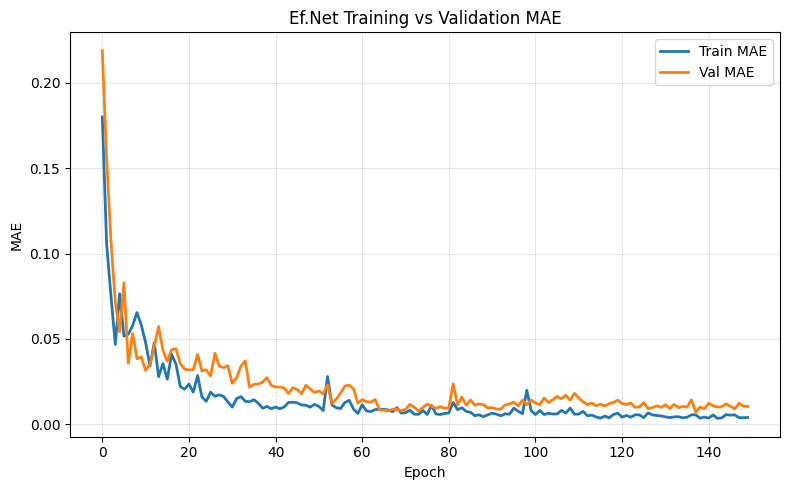

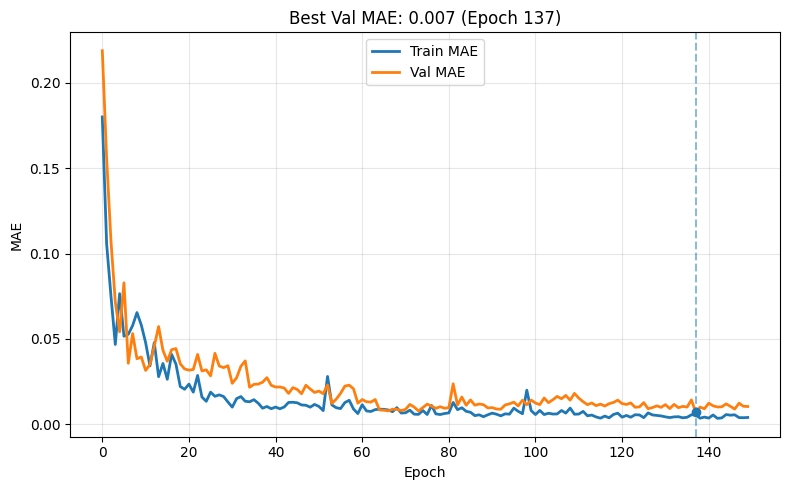

In [ ]:
plt.figure(figsize=(8, 5))
plt.plot(epoch_losses_train, label="Train MAE", linewidth=2)
plt.plot(epoch_losses_val, label="Val MAE", linewidth=2)

plt.xlabel("Epoch")
plt.ylabel("MAE")
plt.title("Ef.Net Training vs Validation MAE")
plt.legend()
plt.grid(alpha=0.3)

plt.tight_layout()
plt.show()

#-----------------------------------------------------

best_epoch = int(np.argmin(epoch_losses_val))
best_val = epoch_losses_val[best_epoch]

plt.figure(figsize=(8, 5))
plt.plot(epoch_losses_train, label="Train MAE", linewidth=2)
plt.plot(epoch_losses_val, label="Val MAE", linewidth=2)

plt.scatter(best_epoch, best_val, zorder=5)
plt.axvline(best_epoch, linestyle="--", alpha=0.5)

plt.xlabel("Epoch")
plt.ylabel("MAE")
plt.title(f"Best Val MAE: {best_val:.3f} (Epoch {best_epoch})")
plt.legend()
plt.grid(alpha=0.3)

plt.tight_layout()
plt.show()


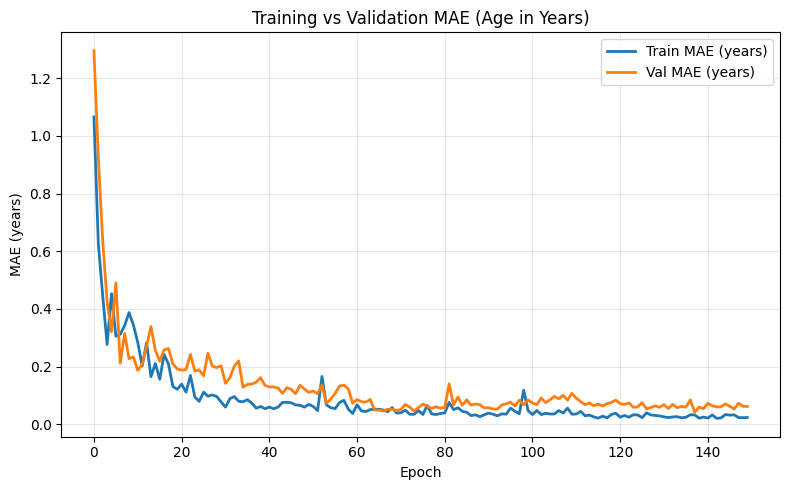

In [ ]:
original_scale_train_loss = [loss * 5.92 for loss in epoch_losses_train]
original_scale_val_loss = [loss * 5.92 for loss in epoch_losses_val]


plt.figure(figsize=(8, 5))
plt.plot(original_scale_train_loss, label="Train MAE (years)", linewidth=2)
plt.plot(original_scale_val_loss, label="Val MAE (years)", linewidth=2)

plt.xlabel("Epoch")
plt.ylabel("MAE (years)")
plt.title("Training vs Validation MAE (Age in Years)")
plt.legend()
plt.grid(alpha=0.3)

plt.tight_layout()
plt.show()


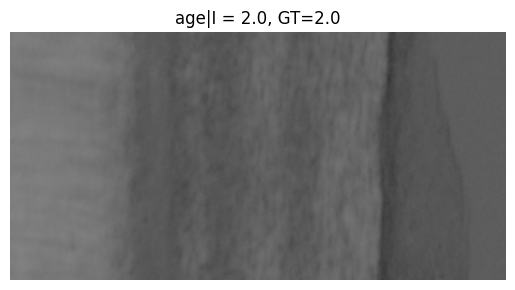

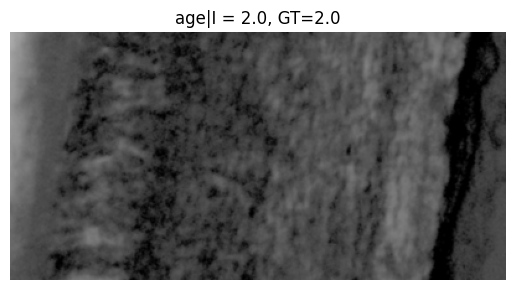

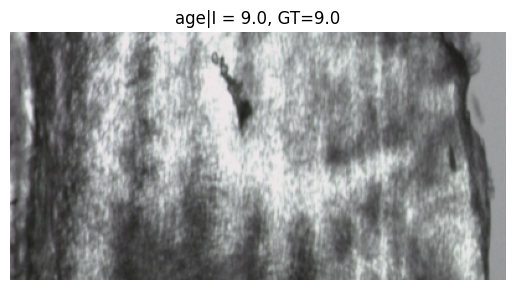

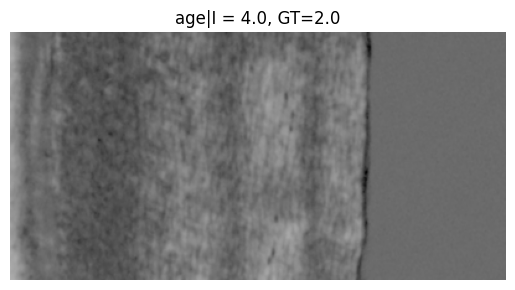

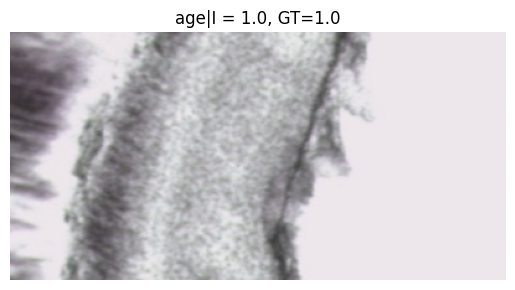

...

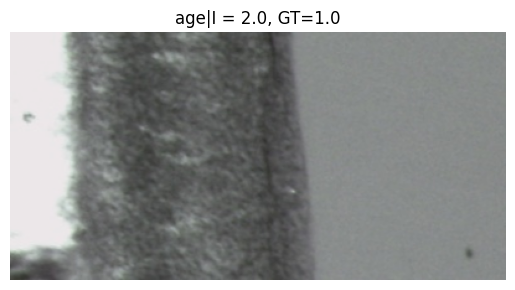

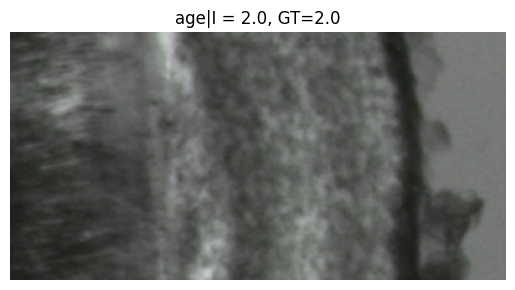

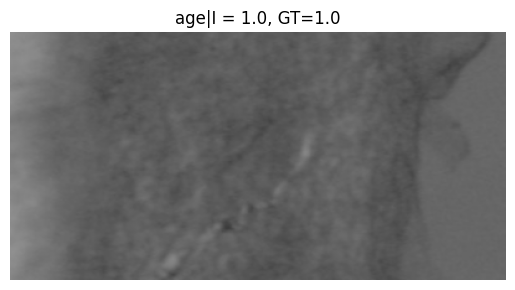

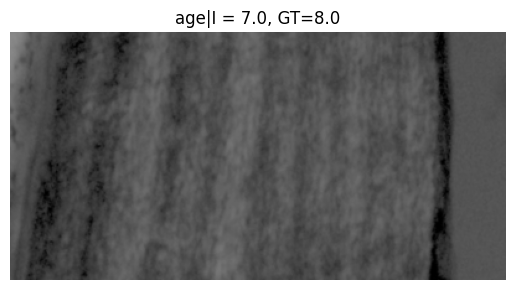

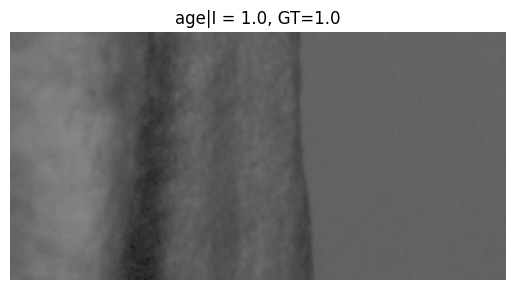

Test MAE: 0.108 normalized, 0.71 years


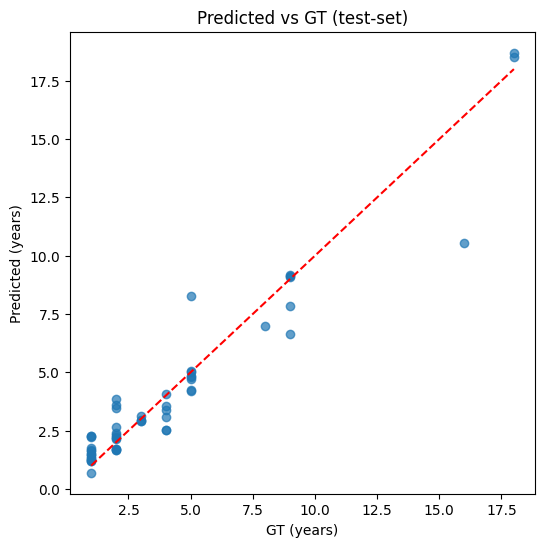

In [ ]:
from torch.nn.functional import l1_loss

device = "cuda" if torch.cuda.is_available() else "cpu"
mean=[0.4533, 0.4691, 0.4300]
std=[0.1011, 0.0967, 0.1070]
age_mean = 5.15
age_std  = 6.61

model.to(device)
model.eval()

def unnormalize(img, mean, std):
    img = img.clone()
    for t, m, s in zip(img, mean, std):
        t.mul_(s).add_(m)
    img = torch.clamp(img, 0, 1)
    return img

all_preds = []
all_labels = []

with torch.no_grad():
    for imgs, ages in test_loader:
        imgs = imgs.to(device)
        ages = ages.to(device)

        preds = model(imgs)
        all_preds.append(preds.cpu())
        all_labels.append(ages.cpu())

        for i in range(imgs.shape[0]):
          img_to_show = unnormalize(imgs[i].cpu(), mean, std)
          plt.figure()
          plt.imshow(img_to_show.permute(1, 2, 0))
          plt.title(f'age|I = {np.round((preds[i].item()*age_std)+age_mean)}, GT={ages[i]* age_std + age_mean}')
          plt.axis('off')
          plt.show()

all_preds = torch.cat(all_preds)
all_labels = torch.cat(all_labels)

preds_years = all_preds * age_std + age_mean
labels_years = all_labels * age_std + age_mean

mae_norm  = l1_loss(all_preds, all_labels).item()
mae_years = l1_loss(preds_years, labels_years).item()

print(f"Test MAE: {mae_norm:.3f} normalized, {mae_years:.2f} years")
plt.figure(figsize=(6,6))
plt.scatter(labels_years.numpy(), preds_years.numpy(), alpha=0.7)
plt.plot([labels_years.min(), labels_years.max()],
         [labels_years.min(), labels_years.max()],
         color='red', linestyle='--')
plt.xlabel("GT (years)")
plt.ylabel("Predicted (years)")
plt.title("Predicted vs GT (test-set)")
plt.show()

In [ ]:
shuffled = labels_years[torch.randperm(len(labels_years))]
print(torch.mean(torch.abs(preds_years - shuffled)))

tensor(3.7604)


In [ ]:
torch.save(model.state_dict(), "effnet_prod_model.pth")
torch.save(model, "full_model.pth")


# Grouping by id - avoid near duplicate leakage

In [ ]:
import os
import torch
from torch.utils.data import Dataset, DataLoader, Subset
from PIL import Image
import pandas as pd
from torchvision import transforms
import numpy as np

transform = transforms.Compose([
    transforms.Resize((200, 400)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.4533, 0.4691, 0.4300],
        std=[0.1011, 0.0967, 0.1070]
    )
])

class SealToothDataset(Dataset):
    def __init__(self, root_dir, labels_dict, age_mean=None, age_std=None, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.image_files = [f for f in os.listdir(root_dir)
                            if f in labels_dict and f.lower().endswith(('.png', '.jpg'))]
        self.labels_dict = labels_dict
        self.age_mean = age_mean
        self.age_std = age_std

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_name = self.image_files[idx]
        img_path = os.path.join(self.root_dir, img_name)
        image = Image.open(img_path).convert('RGB')
        if self.transform:
            image = self.transform(image)

        age = float(self.labels_dict[img_name])
        if self.age_mean is not None and self.age_std is not None:
            age = (age - self.age_mean) / self.age_std  # normalization

        age = torch.tensor(age, dtype=torch.float32)
        return image, age

labels_df = pd.read_csv("annot_crops.csv")

def get_group_id(filename):
    name, ext = os.path.splitext(filename)  # separate extension
    if name.rsplit('_', 1)[-1].isdigit():   # if last part is a digit, remove it
        name = name.rsplit('_', 1)[0]
    return name

labels_df['group_id'] = labels_df['image'].apply(get_group_id)

labels_dict = dict(zip(labels_df['image'], labels_df['age']))

unique_groups = labels_df['group_id'].unique()
np.random.seed(42)
np.random.shuffle(unique_groups)

total_groups = len(unique_groups)
train_end = int(0.7 * total_groups)
val_end   = int(0.8 * total_groups)  # 70/10/20 split

train_groups = unique_groups[:train_end]
val_groups   = unique_groups[train_end:val_end]
test_groups  = unique_groups[val_end:]

dataset = SealToothDataset(
    root_dir="images/SplitImages/",
    labels_dict=labels_dict,
    age_mean=5.15,
    age_std=6.61,
    transform=transform
)

# map image filename → index in dataset.image_files
image_to_idx = {img: i for i, img in enumerate(dataset.image_files)}

def get_indices_by_group(df, groups, image_to_idx):
    indices = []
    for img_name, group_id in zip(df['image'], df['group_id']):
        if group_id in groups and img_name in image_to_idx:
            indices.append(image_to_idx[img_name])
    return indices

train_indices = get_indices_by_group(labels_df, train_groups, image_to_idx)
val_indices   = get_indices_by_group(labels_df, val_groups, image_to_idx)
test_indices  = get_indices_by_group(labels_df, test_groups, image_to_idx)

train_dataset = Subset(dataset, train_indices)
val_dataset   = Subset(dataset, val_indices)
test_dataset  = Subset(dataset, test_indices)

train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True, num_workers=2)
val_loader   = DataLoader(val_dataset, batch_size=8, shuffle=False, num_workers=2)
test_loader  = DataLoader(test_dataset, batch_size=8, shuffle=False, num_workers=2)

print(f"Train: {len(train_dataset)}, Val: {len(val_dataset)}, Test: {len(test_dataset)}")


Train: 193, Val: 25, Test: 55


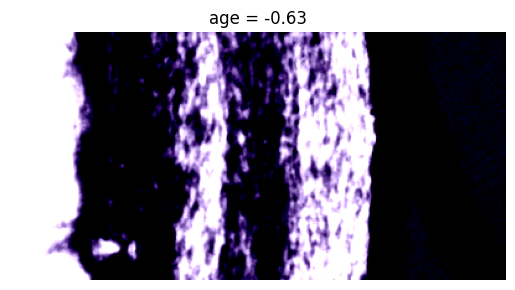

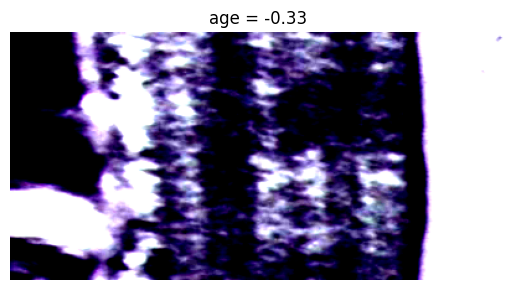

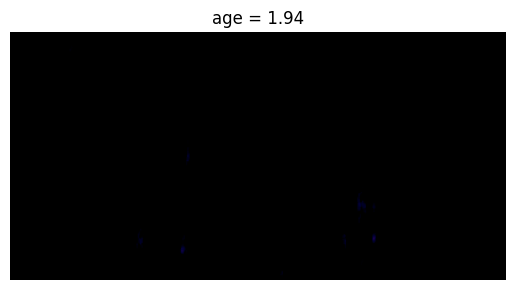

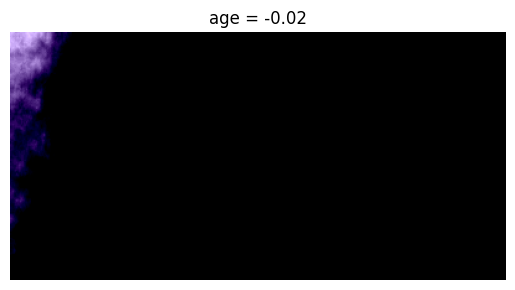

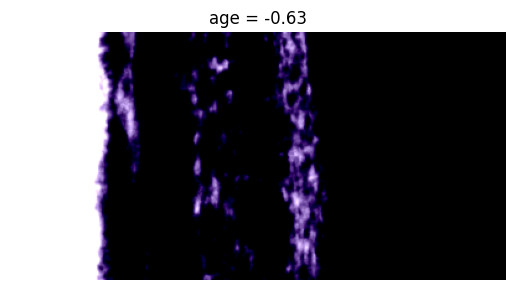

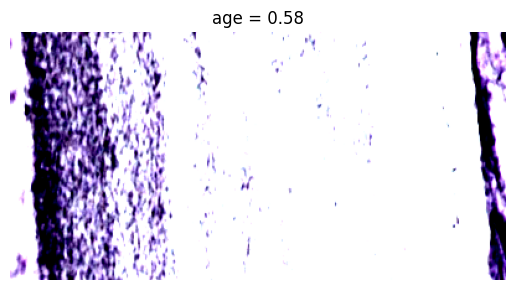

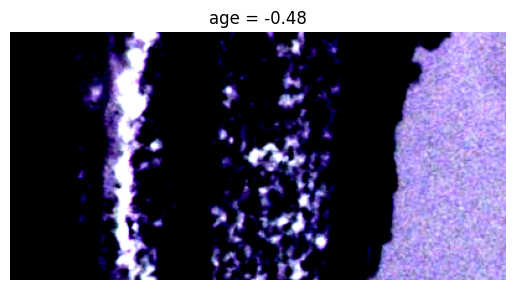

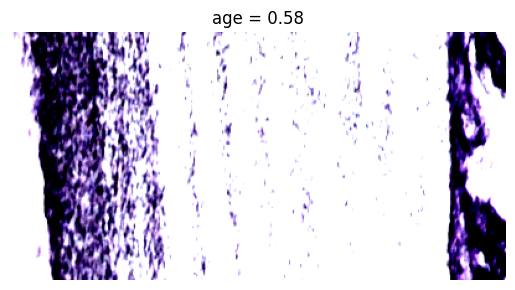

In [ ]:
# Get **one batch** from the loader
imgs, ages = next(iter(train_loader))  # call iter() once
batch_size = imgs.shape[0]

for i in range(batch_size):
    img_to_show = imgs[i].permute(1, 2, 0)
    plt.figure()
    plt.imshow(img_to_show)
    plt.title(f'age = {ages[i].item():.2f}')
    plt.axis('off')
    plt.show()


In [ ]:
import torch.optim as optim
from tqdm import tqdm

device = "cuda" if torch.cuda.is_available() else "cpu"
model = EfficientNetAgeRegressor("efficientnet-b0").to(device)

criterion = nn.SmoothL1Loss(beta=0.5) # MAE
optimizer = torch.optim.AdamW(model.parameters(), lr=5e-5)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, factor=0.5, patience=3)

epoch_losses_train = []
epoch_losses_val = []

for epoch in range(100):
    model.train()
    train_loss = 0

    for imgs, ages in tqdm(train_loader):
        imgs, ages = imgs.to(device), ages.to(device)

        preds = model(imgs)
        loss = criterion(preds, ages)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_loss += loss.item() * imgs.size(0)

    train_loss /= len(train_loader.dataset)
    epoch_losses_train.append(train_loss)
    print(f"Epoch {epoch} Train MAE: {train_loss:.3f}")

    # evaluation
    model.eval()
    val_loss = 0
    with torch.no_grad():
        for imgs, ages in val_loader:
            imgs, ages = imgs.to(device), ages.to(device)
            preds = model(imgs)
            loss = criterion(preds, ages)
            val_loss += loss.item() * imgs.size(0)

    val_loss /= len(val_loader.dataset)
    epoch_losses_val.append(val_loss)
    print(f"Epoch {epoch} Val MAE: {val_loss:.3f}")
    scheduler.step(val_loss) # letting sched see val loss

Loaded pretrained weights for efficientnet-b0


100%|██████████| 25/25 [00:01<00:00, 17.57it/s]

Epoch 0 Train MAE: 0.294


Epoch 0 Val MAE: 0.478


100%|██████████| 25/25 [00:01<00:00, 18.89it/s]

Epoch 1 Train MAE: 0.206


Epoch 1 Val MAE: 0.399


100%|██████████| 25/25 [00:01<00:00, 18.83it/s]

Epoch 2 Train MAE: 0.163


Epoch 2 Val MAE: 0.360


100%|██████████| 25/25 [00:01<00:00, 18.55it/s]

Epoch 3 Train MAE: 0.156


Epoch 3 Val MAE: 0.340


100%|██████████| 25/25 [00:01<00:00, 17.08it/s]

Epoch 4 Train MAE: 0.116


Epoch 4 Val MAE: 0.310


100%|██████████| 25/25 [00:01<00:00, 18.68it/s]

Epoch 5 Train MAE: 0.132


Epoch 5 Val MAE: 0.298


100%|██████████| 25/25 [00:01<00:00, 18.54it/s]

Epoch 6 Train MAE: 0.117


Epoch 6 Val MAE: 0.289


100%|██████████| 25/25 [00:01<00:00, 18.00it/s]

Epoch 7 Train MAE: 0.123


Epoch 7 Val MAE: 0.263


100%|██████████| 25/25 [00:01<00:00, 18.61it/s]

Epoch 8 Train MAE: 0.105


Epoch 8 Val MAE: 0.281


100%|██████████| 25/25 [00:01<00:00, 18.92it/s]

Epoch 9 Train MAE: 0.102


Epoch 9 Val MAE: 0.280


100%|██████████| 25/25 [00:01<00:00, 17.95it/s]

Epoch 10 Train MAE: 0.085


Epoch 10 Val MAE: 0.251


100%|██████████| 25/25 [00:01<00:00, 18.60it/s]

Epoch 11 Train MAE: 0.080


Epoch 11 Val MAE: 0.202


100%|██████████| 25/25 [00:01<00:00, 18.02it/s]

Epoch 12 Train MAE: 0.078


Epoch 12 Val MAE: 0.202


100%|██████████| 25/25 [00:01<00:00, 17.63it/s]

Epoch 13 Train MAE: 0.095


Epoch 13 Val MAE: 0.208


100%|██████████| 25/25 [00:01<00:00, 18.37it/s]

Epoch 14 Train MAE: 0.091


Epoch 14 Val MAE: 0.221


100%|██████████| 25/25 [00:01<00:00, 18.04it/s]

Epoch 15 Train MAE: 0.073


Epoch 15 Val MAE: 0.223


100%|██████████| 25/25 [00:01<00:00, 18.73it/s]

Epoch 16 Train MAE: 0.082


Epoch 16 Val MAE: 0.239


100%|██████████| 25/25 [00:01<00:00, 18.29it/s]

Epoch 17 Train MAE: 0.084


Epoch 17 Val MAE: 0.220


100%|██████████| 25/25 [00:01<00:00, 17.99it/s]

Epoch 18 Train MAE: 0.075


Epoch 18 Val MAE: 0.240


100%|██████████| 25/25 [00:01<00:00, 18.34it/s]

Epoch 19 Train MAE: 0.094


Epoch 19 Val MAE: 0.240


100%|██████████| 25/25 [00:01<00:00, 18.22it/s]

Epoch 20 Train MAE: 0.093


Epoch 20 Val MAE: 0.216


100%|██████████| 25/25 [00:01<00:00, 18.03it/s]

Epoch 21 Train MAE: 0.092


Epoch 21 Val MAE: 0.206


100%|██████████| 25/25 [00:01<00:00, 18.55it/s]

Epoch 22 Train MAE: 0.098


Epoch 22 Val MAE: 0.213


100%|██████████| 25/25 [00:01<00:00, 19.00it/s]

Epoch 23 Train MAE: 0.070


Epoch 23 Val MAE: 0.212


100%|██████████| 25/25 [00:01<00:00, 18.32it/s]

Epoch 24 Train MAE: 0.068


Epoch 24 Val MAE: 0.213


100%|██████████| 25/25 [00:01<00:00, 18.74it/s]

Epoch 25 Train MAE: 0.053


Epoch 25 Val MAE: 0.210


100%|██████████| 25/25 [00:01<00:00, 18.57it/s]

Epoch 26 Train MAE: 0.073


Epoch 26 Val MAE: 0.209


100%|██████████| 25/25 [00:01<00:00, 18.59it/s]

Epoch 27 Train MAE: 0.094


Epoch 27 Val MAE: 0.209


100%|██████████| 25/25 [00:01<00:00, 18.15it/s]

Epoch 28 Train MAE: 0.051


Epoch 28 Val MAE: 0.210


100%|██████████| 25/25 [00:01<00:00, 18.41it/s]

Epoch 29 Train MAE: 0.082


Epoch 29 Val MAE: 0.214


100%|██████████| 25/25 [00:01<00:00, 18.92it/s]

Epoch 30 Train MAE: 0.063


Epoch 30 Val MAE: 0.216


100%|██████████| 25/25 [00:01<00:00, 18.66it/s]

Epoch 31 Train MAE: 0.057


Epoch 31 Val MAE: 0.212


100%|██████████| 25/25 [00:01<00:00, 17.06it/s]

Epoch 32 Train MAE: 0.069


Epoch 32 Val MAE: 0.211


100%|██████████| 25/25 [00:01<00:00, 18.87it/s]

Epoch 33 Train MAE: 0.058


Epoch 33 Val MAE: 0.209


100%|██████████| 25/25 [00:01<00:00, 18.50it/s]

Epoch 34 Train MAE: 0.057


Epoch 34 Val MAE: 0.210


100%|██████████| 25/25 [00:01<00:00, 18.61it/s]

Epoch 35 Train MAE: 0.054


Epoch 35 Val MAE: 0.206


100%|██████████| 25/25 [00:01<00:00, 18.21it/s]

Epoch 36 Train MAE: 0.057


Epoch 36 Val MAE: 0.207


100%|██████████| 25/25 [00:01<00:00, 18.30it/s]

Epoch 37 Train MAE: 0.068


Epoch 37 Val MAE: 0.208


100%|██████████| 25/25 [00:01<00:00, 18.60it/s]

Epoch 38 Train MAE: 0.061


Epoch 38 Val MAE: 0.208


100%|██████████| 25/25 [00:01<00:00, 17.72it/s]

Epoch 39 Train MAE: 0.041


Epoch 39 Val MAE: 0.212


100%|██████████| 25/25 [00:01<00:00, 18.46it/s]

Epoch 40 Train MAE: 0.052


Epoch 40 Val MAE: 0.214


100%|██████████| 25/25 [00:01<00:00, 18.26it/s]

Epoch 41 Train MAE: 0.080


Epoch 41 Val MAE: 0.214


100%|██████████| 25/25 [00:01<00:00, 18.82it/s]

Epoch 42 Train MAE: 0.067


Epoch 42 Val MAE: 0.214


100%|██████████| 25/25 [00:01<00:00, 18.17it/s]

Epoch 43 Train MAE: 0.046


Epoch 43 Val MAE: 0.217


100%|██████████| 25/25 [00:01<00:00, 17.92it/s]

Epoch 44 Train MAE: 0.064


Epoch 44 Val MAE: 0.211


100%|██████████| 25/25 [00:01<00:00, 18.37it/s]

Epoch 45 Train MAE: 0.081


Epoch 45 Val MAE: 0.212


100%|██████████| 25/25 [00:01<00:00, 18.48it/s]

Epoch 46 Train MAE: 0.058


Epoch 46 Val MAE: 0.215


100%|██████████| 25/25 [00:01<00:00, 17.35it/s]

Epoch 47 Train MAE: 0.064


Epoch 47 Val MAE: 0.214


100%|██████████| 25/25 [00:01<00:00, 19.04it/s]

Epoch 48 Train MAE: 0.061


Epoch 48 Val MAE: 0.220


100%|██████████| 25/25 [00:01<00:00, 18.91it/s]

Epoch 49 Train MAE: 0.067


Epoch 49 Val MAE: 0.224


100%|██████████| 25/25 [00:01<00:00, 18.44it/s]

Epoch 50 Train MAE: 0.058


Epoch 50 Val MAE: 0.221


100%|██████████| 25/25 [00:01<00:00, 18.72it/s]

Epoch 51 Train MAE: 0.060


Epoch 51 Val MAE: 0.216


100%|██████████| 25/25 [00:01<00:00, 17.26it/s]

Epoch 52 Train MAE: 0.053


Epoch 52 Val MAE: 0.216


100%|██████████| 25/25 [00:01<00:00, 18.65it/s]

Epoch 53 Train MAE: 0.051


Epoch 53 Val MAE: 0.216


100%|██████████| 25/25 [00:01<00:00, 18.32it/s]

Epoch 54 Train MAE: 0.080


Epoch 54 Val MAE: 0.213


100%|██████████| 25/25 [00:01<00:00, 18.81it/s]

Epoch 55 Train MAE: 0.058


Epoch 55 Val MAE: 0.214


100%|██████████| 25/25 [00:01<00:00, 18.47it/s]

Epoch 56 Train MAE: 0.066


Epoch 56 Val MAE: 0.215


100%|██████████| 25/25 [00:01<00:00, 18.53it/s]

Epoch 57 Train MAE: 0.070


Epoch 57 Val MAE: 0.215


100%|██████████| 25/25 [00:01<00:00, 18.18it/s]

Epoch 58 Train MAE: 0.058


Epoch 58 Val MAE: 0.215


100%|██████████| 25/25 [00:01<00:00, 18.54it/s]

Epoch 59 Train MAE: 0.050


Epoch 59 Val MAE: 0.214


100%|██████████| 25/25 [00:01<00:00, 18.72it/s]

Epoch 60 Train MAE: 0.041


Epoch 60 Val MAE: 0.215


100%|██████████| 25/25 [00:01<00:00, 18.47it/s]

Epoch 61 Train MAE: 0.068


Epoch 61 Val MAE: 0.218


100%|██████████| 25/25 [00:01<00:00, 18.33it/s]

Epoch 62 Train MAE: 0.050


Epoch 62 Val MAE: 0.215


100%|██████████| 25/25 [00:01<00:00, 18.54it/s]

Epoch 63 Train MAE: 0.067


Epoch 63 Val MAE: 0.209


100%|██████████| 25/25 [00:01<00:00, 18.23it/s]

Epoch 64 Train MAE: 0.049


Epoch 64 Val MAE: 0.206


100%|██████████| 25/25 [00:01<00:00, 18.52it/s]

Epoch 65 Train MAE: 0.051


Epoch 65 Val MAE: 0.206


100%|██████████| 25/25 [00:01<00:00, 18.75it/s]

Epoch 66 Train MAE: 0.060


Epoch 66 Val MAE: 0.207


100%|██████████| 25/25 [00:01<00:00, 18.59it/s]

Epoch 67 Train MAE: 0.061


Epoch 67 Val MAE: 0.209


100%|██████████| 25/25 [00:01<00:00, 18.04it/s]

Epoch 68 Train MAE: 0.045


Epoch 68 Val MAE: 0.211


100%|██████████| 25/25 [00:01<00:00, 18.43it/s]

Epoch 69 Train MAE: 0.062


Epoch 69 Val MAE: 0.213


100%|██████████| 25/25 [00:01<00:00, 18.56it/s]

Epoch 70 Train MAE: 0.057


Epoch 70 Val MAE: 0.215


100%|██████████| 25/25 [00:01<00:00, 18.82it/s]

Epoch 71 Train MAE: 0.067


Epoch 71 Val MAE: 0.213


100%|██████████| 25/25 [00:01<00:00, 17.83it/s]

Epoch 72 Train MAE: 0.051


Epoch 72 Val MAE: 0.213


100%|██████████| 25/25 [00:01<00:00, 17.79it/s]

Epoch 73 Train MAE: 0.075


Epoch 73 Val MAE: 0.211


100%|██████████| 25/25 [00:01<00:00, 17.74it/s]

Epoch 74 Train MAE: 0.056


Epoch 74 Val MAE: 0.209


100%|██████████| 25/25 [00:01<00:00, 18.49it/s]

Epoch 75 Train MAE: 0.050


Epoch 75 Val MAE: 0.213


100%|██████████| 25/25 [00:01<00:00, 18.24it/s]

Epoch 76 Train MAE: 0.063


Epoch 76 Val MAE: 0.207


100%|██████████| 25/25 [00:01<00:00, 18.36it/s]

Epoch 77 Train MAE: 0.076


Epoch 77 Val MAE: 0.211


100%|██████████| 25/25 [00:01<00:00, 18.17it/s]

Epoch 78 Train MAE: 0.066


Epoch 78 Val MAE: 0.212


100%|██████████| 25/25 [00:01<00:00, 18.73it/s]

Epoch 79 Train MAE: 0.080


Epoch 79 Val MAE: 0.211


100%|██████████| 25/25 [00:01<00:00, 18.39it/s]

Epoch 80 Train MAE: 0.062


Epoch 80 Val MAE: 0.213


100%|██████████| 25/25 [00:01<00:00, 19.03it/s]

Epoch 81 Train MAE: 0.061


Epoch 81 Val MAE: 0.208


100%|██████████| 25/25 [00:01<00:00, 18.65it/s]

Epoch 82 Train MAE: 0.047


Epoch 82 Val MAE: 0.210


100%|██████████| 25/25 [00:01<00:00, 18.24it/s]

Epoch 83 Train MAE: 0.058


Epoch 83 Val MAE: 0.208


100%|██████████| 25/25 [00:01<00:00, 18.28it/s]

Epoch 84 Train MAE: 0.076


Epoch 84 Val MAE: 0.213


100%|██████████| 25/25 [00:01<00:00, 18.24it/s]

Epoch 85 Train MAE: 0.076


Epoch 85 Val MAE: 0.214


100%|██████████| 25/25 [00:01<00:00, 18.21it/s]

Epoch 86 Train MAE: 0.064


Epoch 86 Val MAE: 0.218


100%|██████████| 25/25 [00:01<00:00, 18.20it/s]

Epoch 87 Train MAE: 0.049


Epoch 87 Val MAE: 0.218


100%|██████████| 25/25 [00:01<00:00, 18.06it/s]

Epoch 88 Train MAE: 0.052


Epoch 88 Val MAE: 0.212


100%|██████████| 25/25 [00:01<00:00, 18.20it/s]

Epoch 89 Train MAE: 0.052


Epoch 89 Val MAE: 0.212


100%|██████████| 25/25 [00:01<00:00, 17.88it/s]

Epoch 90 Train MAE: 0.064


Epoch 90 Val MAE: 0.212


100%|██████████| 25/25 [00:01<00:00, 18.43it/s]

Epoch 91 Train MAE: 0.078


Epoch 91 Val MAE: 0.215


100%|██████████| 25/25 [00:01<00:00, 17.74it/s]

Epoch 92 Train MAE: 0.054


Epoch 92 Val MAE: 0.216


100%|██████████| 25/25 [00:01<00:00, 18.61it/s]

Epoch 93 Train MAE: 0.035


Epoch 93 Val MAE: 0.216


100%|██████████| 25/25 [00:01<00:00, 18.34it/s]

Epoch 94 Train MAE: 0.059


Epoch 94 Val MAE: 0.217


100%|██████████| 25/25 [00:01<00:00, 18.84it/s]

Epoch 95 Train MAE: 0.099


Epoch 95 Val MAE: 0.220


100%|██████████| 25/25 [00:01<00:00, 18.65it/s]

Epoch 96 Train MAE: 0.070


Epoch 96 Val MAE: 0.215


100%|██████████| 25/25 [00:01<00:00, 18.24it/s]

Epoch 97 Train MAE: 0.052


Epoch 97 Val MAE: 0.212


100%|██████████| 25/25 [00:01<00:00, 18.51it/s]

Epoch 98 Train MAE: 0.069


Epoch 98 Val MAE: 0.210


100%|██████████| 25/25 [00:01<00:00, 18.93it/s]

Epoch 99 Train MAE: 0.059


Epoch 99 Val MAE: 0.211


In [ ]:
model.eval()
all_preds, all_labels = [], []

with torch.no_grad():
    for imgs, ages in test_loader:
        imgs, ages = imgs.to(device), ages.to(device)
        preds = model(imgs)
        all_preds.append(preds.cpu())
        all_labels.append(ages.cpu())

all_preds = torch.cat(all_preds)
all_labels = torch.cat(all_labels)

# Unnormalize
preds_years  = all_preds * age_std + age_mean
labels_years = all_labels * age_std + age_mean

mae_years = torch.nn.functional.l1_loss(preds_years, labels_years).item()
print(f"Test MAE: {mae_years:.2f} years")


Test MAE: 1.67 years


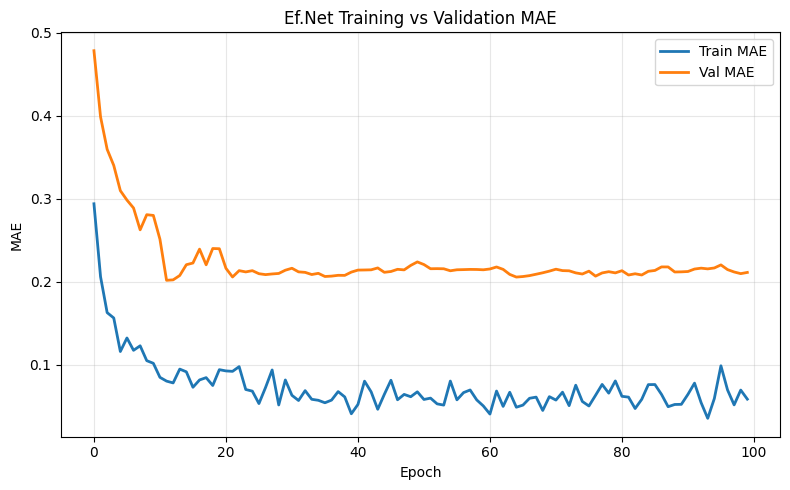

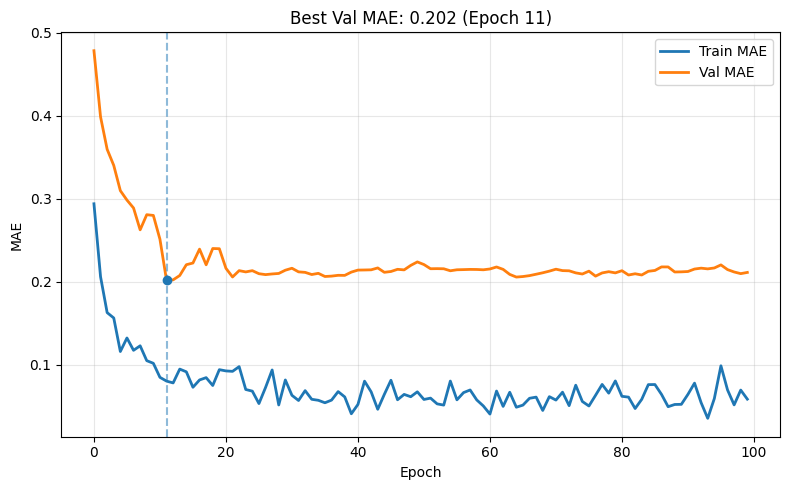

In [ ]:
plt.figure(figsize=(8, 5))
plt.plot(epoch_losses_train, label="Train MAE", linewidth=2)
plt.plot(epoch_losses_val, label="Val MAE", linewidth=2)

plt.xlabel("Epoch")
plt.ylabel("MAE")
plt.title("Ef.Net Training vs Validation MAE")
plt.legend()
plt.grid(alpha=0.3)

plt.tight_layout()
plt.show()

#-----------------------------------------------------

best_epoch = int(np.argmin(epoch_losses_val))
best_val = epoch_losses_val[best_epoch]

plt.figure(figsize=(8, 5))
plt.plot(epoch_losses_train, label="Train MAE", linewidth=2)
plt.plot(epoch_losses_val, label="Val MAE", linewidth=2)

plt.scatter(best_epoch, best_val, zorder=5)
plt.axvline(best_epoch, linestyle="--", alpha=0.5)

plt.xlabel("Epoch")
plt.ylabel("MAE")
plt.title(f"Best Val MAE: {best_val:.3f} (Epoch {best_epoch})")
plt.legend()
plt.grid(alpha=0.3)

plt.tight_layout()
plt.show()


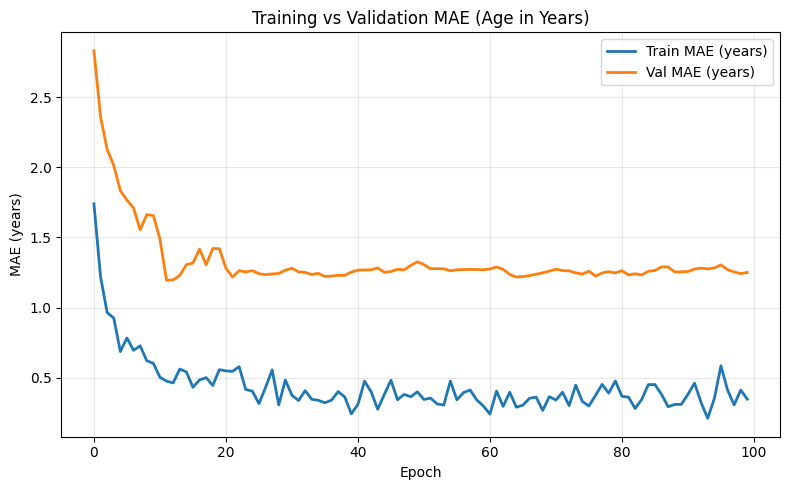

In [ ]:
original_scale_train_loss = [loss * 5.92 for loss in epoch_losses_train]
original_scale_val_loss = [loss * 5.92 for loss in epoch_losses_val]


plt.figure(figsize=(8, 5))
plt.plot(original_scale_train_loss, label="Train MAE (years)", linewidth=2)
plt.plot(original_scale_val_loss, label="Val MAE (years)", linewidth=2)

plt.xlabel("Epoch")
plt.ylabel("MAE (years)")
plt.title("Training vs Validation MAE (Age in Years)")
plt.legend()
plt.grid(alpha=0.3)

plt.tight_layout()
plt.show()

In [ ]:
from torch.nn.functional import l1_loss

device = "cuda" if torch.cuda.is_available() else "cpu"
mean=[0.4533, 0.4691, 0.4300]
std=[0.1011, 0.0967, 0.1070]
age_mean = 5.15
age_std  = 6.61

model.to(device)
model.eval()

def unnormalize(img, mean, std):
    img = img.clone()
    for t, m, s in zip(img, mean, std):
        t.mul_(s).add_(m)
    img = torch.clamp(img, 0, 1)
    return img

all_preds = []
all_labels = []

with torch.no_grad():
    for imgs, ages in test_loader:
        imgs = imgs.to(device)
        ages = ages.to(device)

        preds = model(imgs)
        all_preds.append(preds.cpu())
        all_labels.append(ages.cpu())

        for i in range(imgs.shape[0]):
          img_to_show = unnormalize(imgs[i].cpu(), mean, std)
          plt.figure()
          plt.imshow(img_to_show.permute(1, 2, 0))
          plt.title(f'age|I = {np.floor((preds[i].item()*age_std)+age_mean)}, GT={ages[i]* age_std + age_mean}')
          plt.axis('off')
          plt.show()

all_preds = torch.cat(all_preds)
all_labels = torch.cat(all_labels)

preds_years = all_preds * age_std + age_mean
labels_years = all_labels * age_std + age_mean

mae_norm  = l1_loss(all_preds, all_labels).item()
mae_years = l1_loss(preds_years, labels_years).item()

print(f"Test MAE: {mae_norm:.3f} normalized, {mae_years:.2f} years")
plt.figure(figsize=(6,6))
plt.scatter(labels_years.numpy(), preds_years.numpy(), alpha=0.7)
plt.plot([labels_years.min(), labels_years.max()],
         [labels_years.min(), labels_years.max()],
         color='red', linestyle='--')
plt.xlabel("GT (years)")
plt.ylabel("Predicted (years)")
plt.title("Predicted vs GT (test-set)")
plt.show()

# compute mae for np.floor predictions
mae_years_floor = l1_loss(np.floor(preds_years), labels_years).item()
print(f"Test MAE (floor): {mae_years_floor:.2f} years")